# Potato Disease Classification & Severity Estimation

link of dataset: https://www.kaggle.com/arjuntejaswi/plant-village

Link of product demo - https://drive.google.com/file/d/1EgS6ItoRhaOfOo9YFqEr2KN_Gv6G0Dig/view?usp=sharing

### Import all the Dependencies

In [2]:
import tensorflow as tf
from tensorflow.keras import models, layers
import matplotlib.pyplot as plt
from IPython.display import HTML

### Set all the Constants

In [3]:
BATCH_SIZE = 32
IMAGE_SIZE = 256
CHANNELS=3
EPOCHS=10

### Import data into tensorflow dataset object

In [4]:
dataset = tf.keras.preprocessing.image_dataset_from_directory(
    "potato-disease\\training\\PlantVillage\\color",  
    seed=123,                                          # For shuffling reproducibility
    shuffle=True,                                      # Shuffle images and labels
    image_size=(IMAGE_SIZE, IMAGE_SIZE),               # Resize all images to 256x256
    batch_size=BATCH_SIZE                              # Load 32 images per batch
)

Found 2152 files belonging to 3 classes.


# Data Preprocessing and exploration

In [5]:
##check how many class levels we have in our dataset. 
class_names = dataset.class_names
class_names

['Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy']

In [6]:
# Loop over one batch of images and labels from the dataset
for image_batch, labels_batch in dataset.take(1):
    
    # Print the shape of the image batch
    print("Image batch shape:", image_batch.shape)
    print("Labels in this batch:", labels_batch.numpy())

Image batch shape: (32, 256, 256, 3)
Labels in this batch: [1 1 1 0 0 0 0 0 1 1 1 1 0 1 0 1 1 1 0 1 0 1 0 0 1 0 0 1 1 2 0 0]


As you can see above, each element in the dataset is a tuple. First element is a batch of 32 elements of images. Second element is a batch of 32 elements of class labels 

### Visualize some of the images from our dataset

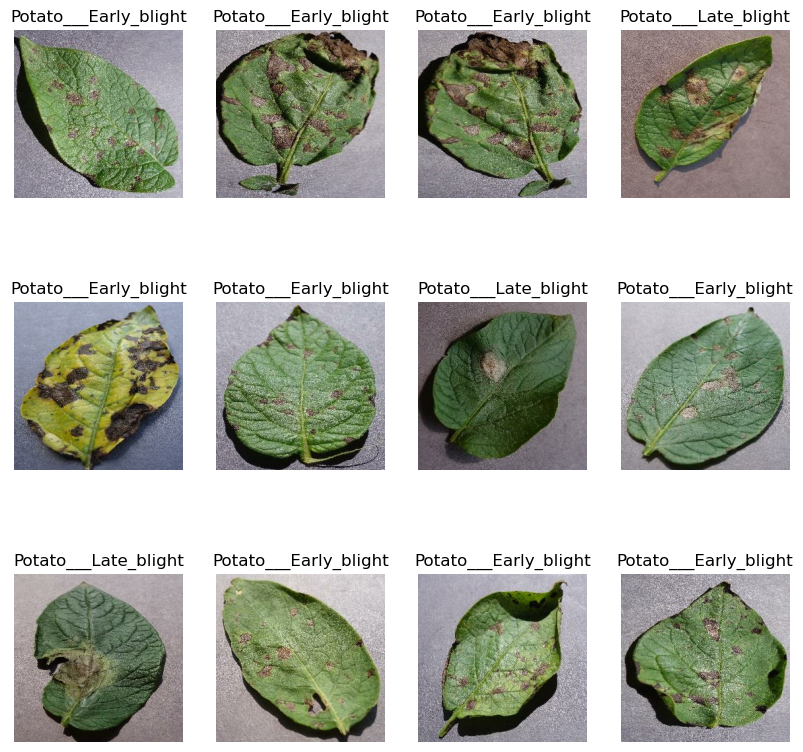

In [7]:
# Create a figure for plotting images with a size of 10x10 inches
plt.figure(figsize=(10, 10))

# Take one batch from the dataset (images + labels)
for image_batch, label_batch in dataset.take(1):
  
  # Loop through the first 12 images in the batch
  for i in range(12):
    
    # Create a 3x4 grid of subplots and select the (i+1)th subplot
    ax = plt.subplot(3, 4, 1 + i)
    plt.imshow(image_batch[i].numpy().astype("uint8"))
    
    # Set the title as the class name (e.g., "Healthy", "Early_blight", etc.)
    plt.title(class_names[label_batch[i]])
    
    # Hide the axis ticks and labels for a cleaner display
    plt.axis("off")


### Function to Split Dataset

Dataset should be bifurcated into 3 subsets, namely:
1. Training: Dataset to be used while training
2. Validation: Dataset to be tested against while training
3. Test: Dataset to be tested against after we trained a model

In [8]:
len(dataset)

68

In [9]:
train_size = 0.8
len(dataset)*train_size

54.400000000000006

In [10]:
train_ds = dataset.take(54)
len(train_ds)

54

In [11]:
test_ds = dataset.skip(54)
len(test_ds)

14

In [12]:
val_size=0.1
len(dataset)*val_size

6.800000000000001

In [13]:
val_ds = test_ds.take(6)
len(val_ds)

6

In [14]:
test_ds = test_ds.skip(6)
len(test_ds)

8

In [15]:
def get_dataset_partitions_tf(ds, train_split=0.8, val_split=0.1, test_split=0.1, shuffle=True, shuffle_size=10000):
    assert (train_split + test_split + val_split) == 1
    
    ds_size = len(ds)
    
    if shuffle:
        ds = ds.shuffle(shuffle_size, seed=12)
    
    train_size = int(train_split * ds_size)
    val_size = int(val_split * ds_size)
    
    train_ds = ds.take(train_size)    
    val_ds = ds.skip(train_size).take(val_size)
    test_ds = ds.skip(train_size).skip(val_size)
    
    return train_ds, val_ds, test_ds

In [16]:
train_ds, val_ds, test_ds = get_dataset_partitions_tf(dataset)

In [17]:
len(train_ds)

54

In [18]:
len(val_ds)

6

In [19]:
len(test_ds)

8

### Cache, Shuffle, and Prefetch the Dataset

In [20]:
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
val_ds = val_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)
test_ds = test_ds.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

## Building the Model

### Creating a Layer for Resizing and Normalization
Before feeding our images into the network, we need to resize them to the required dimensions. Also, to enhance model performance, it’s important to normalize the image pixel values (by dividing them by 256 to keep them in the 0 to 1 range). This should be done during both training and inference. So, we can include this as a layer in our Sequential Model.

Why we need to resize an image that’s already (256, 256) to (256, 256) again. And yes, you’re right—it’s not necessary during training if the images are already in the correct size. However, this becomes useful once the model is trained and we start using it for predictions. At that point, someone might provide an image that isn’t (256, 256), and this layer will ensure it’s resized properly.

In [21]:
resize_and_rescale = tf.keras.Sequential([
  layers.Resizing(IMAGE_SIZE, IMAGE_SIZE),
  layers.Rescaling(1.0/255),
])

### Data Augmentation
Data Augmentation is needed when we have less data, this boosts the accuracy of our model by augmenting the data.

In [22]:
data_augmentation = tf.keras.Sequential([
  layers.RandomFlip("horizontal_and_vertical"),
  layers.RandomRotation(0.2),
])

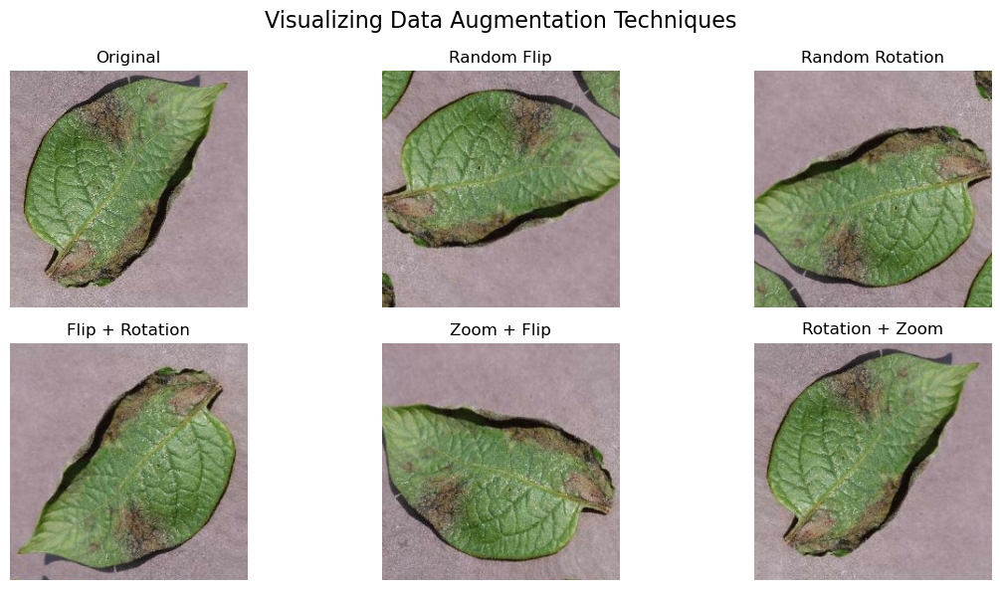

In [23]:
# Visualize Data Augmentation 

# select one image to check augmentation techniques 
for images, labels in dataset.take(1):
    sample_image = images[0]
    break

# Define augmentation descriptions for each variation
augmentation_titles = [
    "Original",
    "Random Flip",
    "Random Rotation",
    "Flip + Rotation",
    "Zoom + Flip",
    "Rotation + Zoom"
]

plt.figure(figsize=(12, 6))

for i in range(6):
    ax = plt.subplot(2, 3, i + 1)

    if i == 0:
        aug_image = sample_image
    else:
        aug_image = data_augmentation(tf.expand_dims(sample_image, 0), training=True)[0]
    
    plt.imshow(aug_image.numpy().astype("uint8"))
    plt.title(augmentation_titles[i])
    plt.axis("off")

plt.suptitle("Visualizing Data Augmentation Techniques", fontsize=16)
plt.tight_layout()
plt.show()



#### Applying Data Augmentation to Train Dataset

In [24]:
train_ds = train_ds.map(
    lambda x, y: (data_augmentation(x, training=True), y)
).prefetch(buffer_size=tf.data.AUTOTUNE)



### Model Architecture
We use a CNN coupled with a Softmax activation in the output layer. We also add the initial layers for resizing, normalization and Data Augmentation.

In [25]:
input_shape = (BATCH_SIZE, IMAGE_SIZE, IMAGE_SIZE, CHANNELS)
n_classes = 3

model = models.Sequential([
    resize_and_rescale,
    layers.Conv2D(32, kernel_size = (3,3), activation='relu', input_shape=input_shape),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64,  kernel_size = (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64,  kernel_size = (3,3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(64, activation='relu'),
    layers.Dense(n_classes, activation='softmax'),
])

model.build(input_shape=input_shape)

C:\Users\sabbir__dewan\anaconda3\Lib\site-packages\keras\src\layers\convolutional\base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [26]:
model.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ sequential (Sequential)              │ (32, 256, 256, 3)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (32, 254, 254, 32)          │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (32, 127, 127, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (32, 125, 125, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (32, 62, 62, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (32, 60, 60, 64)            │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (32, 30, 30, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (32, 28, 28, 64)            │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (32, 14, 14, 64)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_4 (Conv2D)                    │ (32, 12, 12, 64)            │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_4 (MaxPooling2D)       │ (32, 6, 6, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_5 (Conv2D)                    │ (32, 4, 4, 64)              │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_5 (MaxPooling2D)       │ (32, 2, 2, 64)              │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (32, 256)                   │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (32, 64)                    │          16,448 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (32, 3)                     │             195 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 183,747 (717.76 KB)

 Trainable params: 183,747 (717.76 KB)

 Non-trainable params: 0 (0.00 B)

### Compiling the Model
We use `adam` Optimizer, `SparseCategoricalCrossentropy` for losses, `accuracy` as a metric

In [27]:
model.compile(
    optimizer='adam',
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
    metrics=['accuracy']
)

In [28]:
history = model.fit(
    train_ds,
    batch_size=BATCH_SIZE,
    validation_data=val_ds,
    verbose=1,
    epochs=10,
)

Epoch 1/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 27s 433ms/step - accuracy: 0.4553 - loss: 0.9560 - val_accuracy: 0.7760 - val_loss: 0.8966
Epoch 2/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 33s 608ms/step - accuracy: 0.6209 - loss: 0.7927 - val_accuracy: 0.7708 - val_loss: 0.5569
Epoch 3/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 32s 593ms/step - accuracy: 0.7881 - loss: 0.5439 - val_accuracy: 0.7917 - val_loss: 0.4668
Epoch 4/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 32s 585ms/step - accuracy: 0.8216 - loss: 0.4390 - val_accuracy: 0.8750 - val_loss: 0.2851
Epoch 5/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 33s 614ms/step - accuracy: 0.8471 - loss: 0.3519 - val_accuracy: 0.8750 - val_loss: 0.3116
Epoch 6/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 32s 593ms/step - accuracy: 0.8992 - loss: 0.2535 - val_accuracy: 0.8958 - val_loss: 0.2576
Epoch 7/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 32s 592ms/step - accuracy: 0.9216 - loss: 0.2142 - val_accuracy: 0.8594 - val_loss: 0.3245
Epoch 8/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 32s 595ms/step - accuracy: 0.9132 - loss: 0.2091 - val_accu

In [29]:
scores = model.evaluate(test_ds)

8/8 ━━━━━━━━━━━━━━━━━━━━ 2s 148ms/step - accuracy: 0.8755 - loss: 0.2888


In [30]:
scores

[0.26505735516548157, 0.890625]

Scores is just a list containing loss and accuracy value

### Plotting the Accuracy and Loss Curves

In [31]:
history

In [32]:
history.params

{'verbose': 1, 'epochs': 10, 'steps': 54}

In [33]:
history.history.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [34]:
type(history.history['loss'])

list

In [35]:
len(history.history['loss'])

10

In [36]:
history.history['loss'][:5] # show loss for first 5 epochs

[0.9222190976142883,
 0.6984394192695618,
 0.49902233481407166,
 0.40570709109306335,
 0.3137689232826233]

In [37]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

loss = history.history['loss']
val_loss = history.history['val_loss']

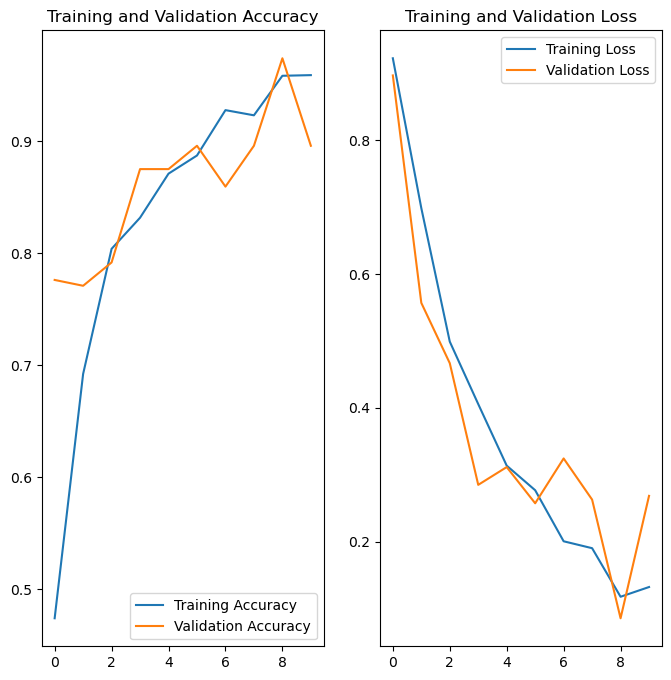

In [38]:
plt.figure(figsize=(8, 8))
plt.subplot(1, 2, 1)
plt.plot(range(EPOCHS), acc, label='Training Accuracy')
plt.plot(range(EPOCHS), val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(range(EPOCHS), loss, label='Training Loss')
plt.plot(range(EPOCHS), val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.show()

### Run prediction on a sample image

first image to predict
actual label: Potato___Late_blight
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step
predicted label: Potato___Late_blight


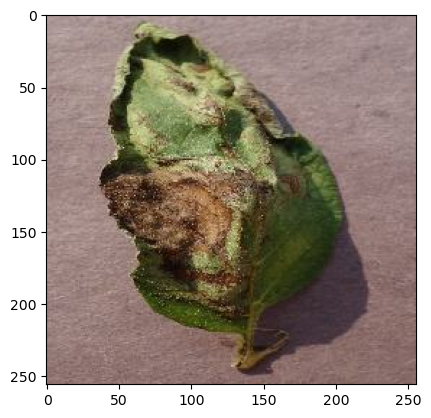

In [39]:
import numpy as np
for images_batch, labels_batch in test_ds.take(1):
    
    first_image = images_batch[0].numpy().astype('uint8')
    first_label = labels_batch[0].numpy()
    
    print("first image to predict")
    plt.imshow(first_image)
    print("actual label:",class_names[first_label])
    
    batch_prediction = model.predict(images_batch)
    print("predicted label:",class_names[np.argmax(batch_prediction[0])])

### Write a function for inference

In [40]:
def predict(model, img):
    img_array = tf.keras.preprocessing.image.img_to_array(images[i].numpy())
    img_array = tf.expand_dims(img_array, 0)

    predictions = model.predict(img_array)

    predicted_class = class_names[np.argmax(predictions[0])]
    confidence = round(100 * (np.max(predictions[0])), 2)
    return predicted_class, confidence

**Now run inference on few sample images**

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step


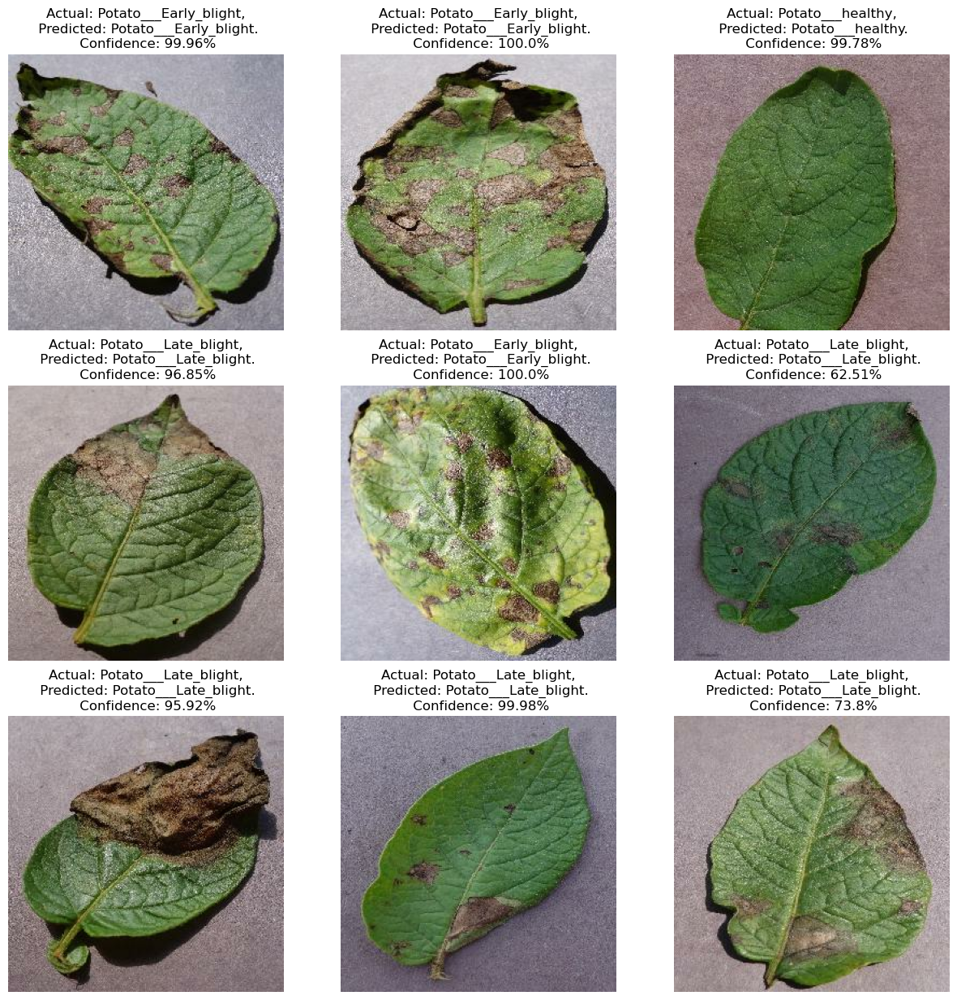

In [41]:
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        
        predicted_class, confidence = predict(model, images[i].numpy())
        actual_class = class_names[labels[i]] 
        
        plt.title(f"Actual: {actual_class},\n Predicted: {predicted_class}.\n Confidence: {confidence}%")
        
        plt.axis("off")

### Saving the Model
We append the model to the list of models as a new version

In [42]:
import os

# Ensure the models directory exists
os.makedirs("models", exist_ok=True)

# Get the next version number (e.g., 1, 2, 3...)
existing_versions = [int(folder) for folder in os.listdir("models") if folder.isdigit()]
model_version = max(existing_versions + [0]) + 1

# Save the model with .keras extension (recommended)
model.save(f"models/{model_version}.keras")  # or .h5 for legacy format

# Implement VGG16 MODEL

In [43]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Dense, Flatten, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

In [44]:
# Load VGG16 base model with input size 256x256x3
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(256, 256, 3))

# Add custom fully connected layers
x = base_model.output
x = Flatten()(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
predictions = Dense(3, activation='softmax')(x)  

# Build the full model
model = Model(inputs=base_model.input, outputs=predictions)

In [45]:
for layer in base_model.layers:
    layer.trainable = False

In [46]:
model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy', 
    metrics=['accuracy']
)

In [47]:
early_stopping = EarlyStopping(
    monitor='val_accuracy',
    patience=5, # Stops training when there is no change for first 5 consecutive validation accuracy values
    verbose=1,
    mode='max',
    restore_best_weights=True
)

In [48]:
history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=5,  # Set a high number of epochs; early stopping will stop training early.
    callbacks=[early_stopping]
)

Epoch 1/5
54/54 ━━━━━━━━━━━━━━━━━━━━ 310s 6s/step - accuracy: 0.6999 - loss: 27.1781 - val_accuracy: 0.9375 - val_loss: 1.4527
Epoch 2/5
54/54 ━━━━━━━━━━━━━━━━━━━━ 289s 5s/step - accuracy: 0.9043 - loss: 1.6607 - val_accuracy: 0.9688 - val_loss: 0.1197
Epoch 3/5
54/54 ━━━━━━━━━━━━━━━━━━━━ 309s 6s/step - accuracy: 0.9120 - loss: 0.5817 - val_accuracy: 0.9375 - val_loss: 0.3141
Epoch 4/5
54/54 ━━━━━━━━━━━━━━━━━━━━ 339s 6s/step - accuracy: 0.9244 - loss: 0.2452 - val_accuracy: 0.9740 - val_loss: 0.0884
Epoch 5/5
54/54 ━━━━━━━━━━━━━━━━━━━━ 310s 6s/step - accuracy: 0.9316 - loss: 0.2768 - val_accuracy: 0.9688 - val_loss: 0.0779
Restoring model weights from the end of the best epoch: 4.


In [49]:
# Evaluate the model on the test dataset
test_loss, test_accuracy = model.evaluate(test_ds)
print(f'Test accuracy: {test_accuracy:.4f}')

8/8 ━━━━━━━━━━━━━━━━━━━━ 43s 5s/step - accuracy: 0.9405 - loss: 0.3366
Test accuracy: 0.9414


In [50]:
# Save the trained model
model.save('vgg16_image_classification_model.h5')

Testing The model

Create Class label dictionary

In [51]:
import json

# Get class names from the dataset
#class_names = dataset.class_names 

# Convert to a dict with index: class name
class_indices = {i: name for i, name in enumerate(class_names)}

# Save to JSON
with open("class_names.json", "w") as f:
    json.dump(class_indices, f, indent=4)

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 583ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 336ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 274ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 321ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 329ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 344ms/step


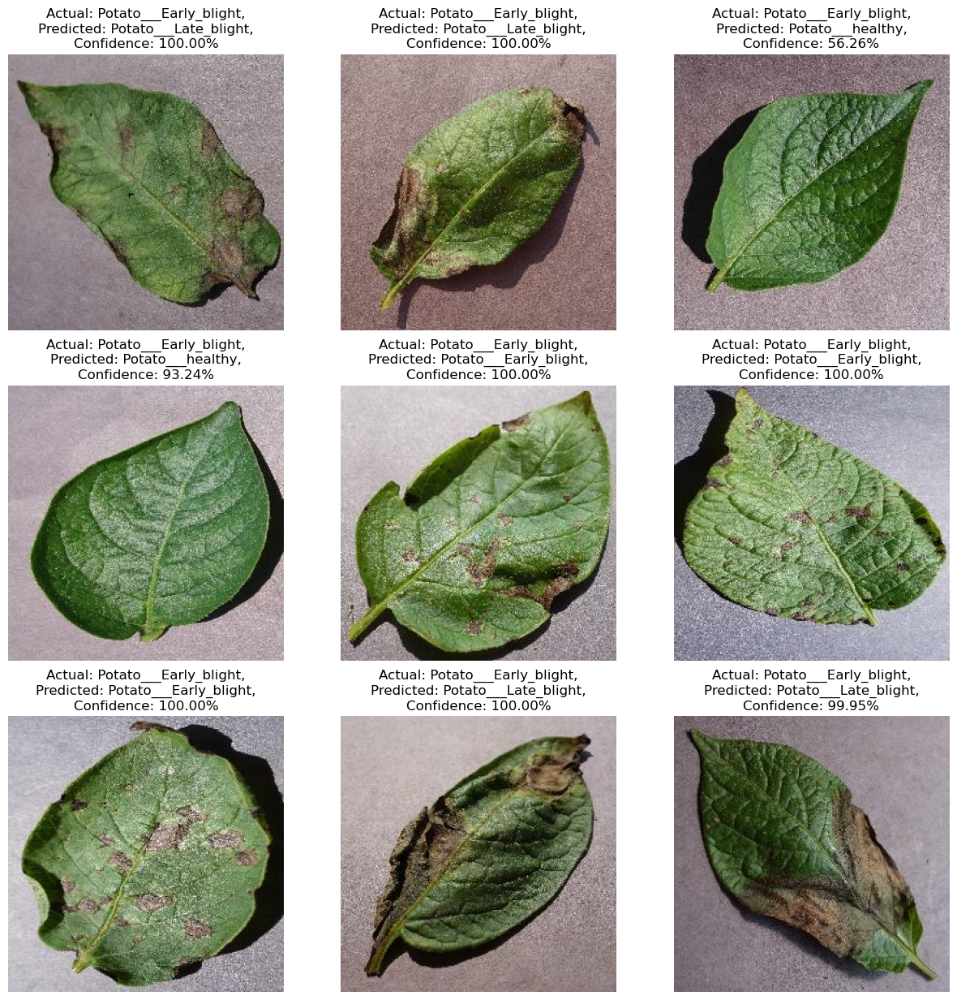

In [52]:
# Load the trained VGG16 model
model_path = "vgg16_image_classification_model.h5"
model = tf.keras.models.load_model(model_path)

# Load the class names from the JSON file
with open("class_names.json") as f:
    class_names = json.load(f)

# Define a function for prediction
def predict(model, image):
    # Expand the image dimensions to match the model input
    image = np.expand_dims(image, axis=0)
    
    # Get the prediction from the model
    result = model.predict(image)
    
    # Get the predicted class index and its confidence
    predicted_class = np.argmax(result, axis=1)[0]
    confidence = 100 * np.max(result, axis=1)[0]
    
    return class_names[str(predicted_class)], confidence

# Plot images, actual labels, and predicted labels with confidence
plt.figure(figsize=(15, 15))
for images, labels in test_ds.take(1):  # Take first batch from the dataset
    for i in range(9):  # Loop through the first 9 images in the batch
        ax = plt.subplot(3, 3, i + 1)
        
        # Display the image
        plt.imshow(images[i].numpy().astype("uint8"))
        
        # Make predictions for the current image
        predicted_class, confidence = predict(model, images[i].numpy())
        
        # Get the actual class from the label
        actual_class = class_names[str(np.argmax(labels[i].numpy()))]
        
        # Display the title with actual and predicted classes
        plt.title(f"Actual: {actual_class},\nPredicted: {predicted_class},\nConfidence: {confidence:.2f}%")
        
        plt.axis("off")  # Turn off axis

plt.show()


# Get the classification report on VGG16 model with background images leaf

In [53]:
from sklearn.metrics import classification_report
import numpy as np

# Step 1: Collect predictions
y_true = []
y_pred = []

for images, labels in test_ds:
    preds = model.predict(images)
    y_true.extend(labels.numpy())
    y_pred.extend(np.argmax(preds, axis=1))

# Step 2: Define class names
class_names = ['Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy']

# Step 3: Generate report
print("Classification Report:\n")
print(classification_report(y_true, y_pred, target_names=class_names))


1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
Classification Report:

                       precision    recall  f1-score   support

Potato___Early_blight       0.98      0.95      0.96       124
 Potato___Late_blight       0.91      0.97      0.94       111
     Potato___healthy       0.94      0.71      0.81        21

             accuracy                           0.94       256
            macro avg       0.94      0.88      0.90       256
         weighted avg       0.94      0.94      0.94       256



# Add Grad CAM to check from where my model is learning

In [54]:
import cv2
import numpy as np 

def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    grad_model = tf.keras.models.Model(
        [model.inputs], 
        [model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(tf.expand_dims(img_array, axis=0))
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])
        class_output = predictions[:, pred_index]

    grads = tape.gradient(class_output, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

def display_gradcam(image, heatmap, alpha=0.4):
    heatmap = cv2.resize(heatmap, (image.shape[1], image.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    overlay = cv2.addWeighted(image, 1 - alpha, heatmap_color, alpha, 0)
    return overlay


C:\Users\sabbir__dewan\anaconda3\Lib\site-packages\keras\src\models\functional.py:238: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['input_layer_3']]
Received: inputs=Tensor(shape=(1, 256, 256, 3))
  warnings.warn(msg)


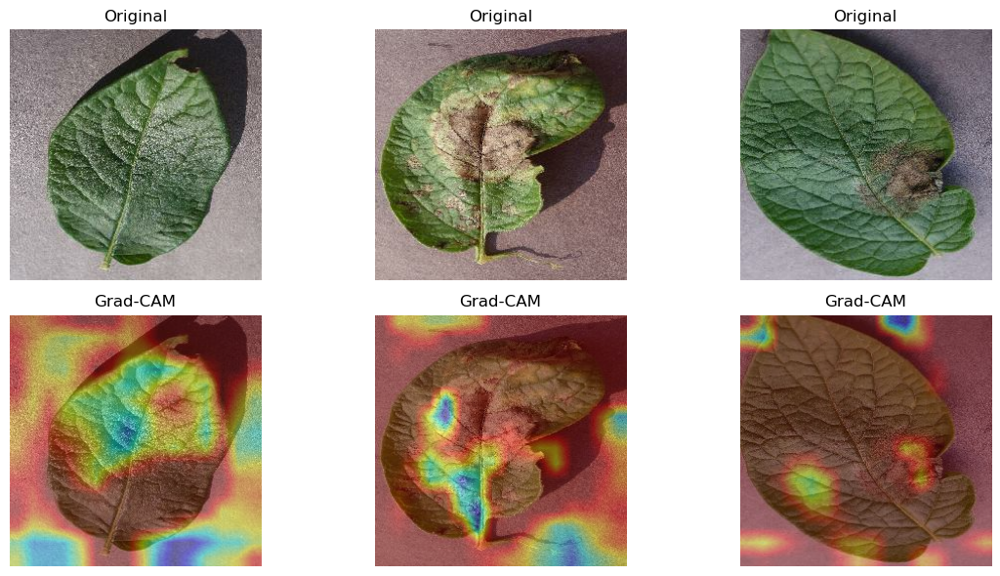

In [55]:
#Visualize Grad-CAM 

plt.figure(figsize=(12, 6))
for images, labels in test_ds.take(1):
    for i in range(3):
        img = images[i].numpy().astype("uint8")
        preprocessed = tf.keras.applications.vgg16.preprocess_input(img.copy())

        # Get Grad-CAM heatmap
        heatmap = make_gradcam_heatmap(preprocessed, model, last_conv_layer_name='block5_conv3')

        # Overlay it on the original image
        cam_image = display_gradcam(img, heatmap)

        # Plot
        plt.subplot(2, 3, i + 1)
        plt.imshow(img)
        plt.title("Original")
        plt.axis("off")

        plt.subplot(2, 3, i + 4)
        plt.imshow(cam_image)
        plt.title("Grad-CAM")
        plt.axis("off")
    break

plt.tight_layout()
plt.show()


There's some problem as the model is learning outside of the image region. we can fix this by removing the background and only focus on the image.  

# Remove background of image and train aagain by using Color-based background segmentation using HSV masking to isolate green regions (leaves) and remove background pixels.

In [56]:
import cv2
import numpy as np

def remove_background(image):
    # Convert to HSV
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)

    # Define range for green color (leaf)
    lower_green = np.array([25, 40, 40])
    upper_green = np.array([95, 255,255])

    # Create mask for green areas
    mask = cv2.inRange(hsv, lower_green, upper_green)

    # Bitwise AND to keep leaf only
    result = cv2.bitwise_and(image, image, mask=mask)

    return result


## The following code block is commented as it was used to remove the background from the images and later saved in a directory. 
## Images are saved on cleaned_data  directory. You can use it by uncommenting the block, but it may take some time to complete the process. 

In [57]:
# import os
# from PIL import Image

# input_dir = 'potato-disease/training/PlantVillage/color'
# output_dir = 'cleaned_data'
# os.makedirs(output_dir, exist_ok=True)

# for class_folder in os.listdir(input_dir):
#     class_path = os.path.join(input_dir, class_folder)
#     output_class_path = os.path.join(output_dir, class_folder)
#     os.makedirs(output_class_path, exist_ok=True)

#     for img_file in os.listdir(class_path):
#         img_path = os.path.join(class_path, img_file)
#         image = cv2.imread(img_path)
#         image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

#         cleaned = remove_background(image)
#         cleaned = cv2.cvtColor(cleaned, cv2.COLOR_RGB2BGR)

#         # Save
#         out_path = os.path.join(output_class_path, img_file)
#         cv2.imwrite(out_path, cleaned)


In [58]:
dataset_without_bckgrnd = tf.keras.preprocessing.image_dataset_from_directory(
    "cleaned_data",  
    seed=123,                                          # For shuffling reproducibility
    shuffle=True,                                      # Shuffle images and labels
    image_size=(IMAGE_SIZE, IMAGE_SIZE),               # Resize all images to 256x256
    batch_size=BATCH_SIZE                              # Load 32 images per batch
)

Found 2152 files belonging to 3 classes.


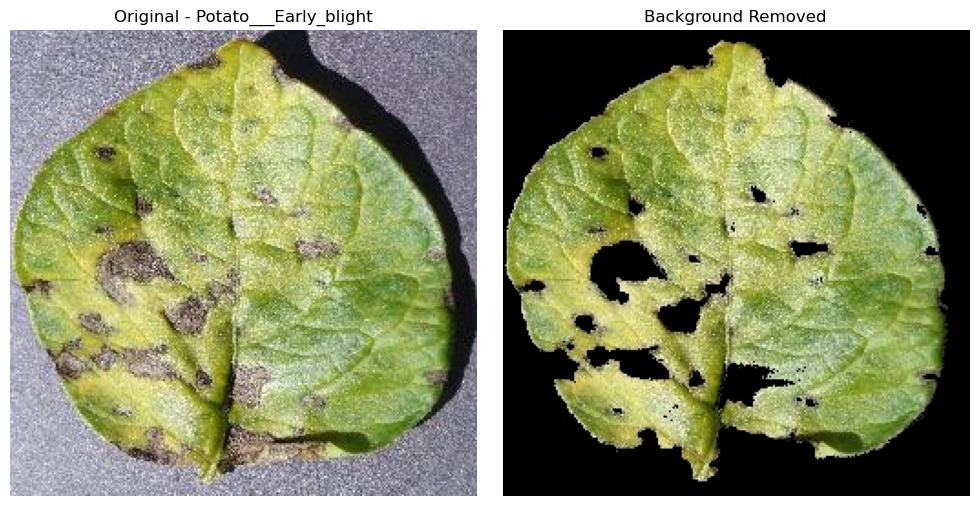

In [60]:
# Set original and cleaned directories
import random
original_root = 'potato-disease/training/PlantVillage/color'
cleaned_root = 'cleaned_data'

# Randomly choose a class folder
class_folders = os.listdir(original_root)
chosen_class = random.choice(class_folders)

# Get image files from that class
image_files = os.listdir(os.path.join(original_root, chosen_class))
chosen_image = random.choice(image_files)

# Construct full paths
original_path = os.path.join(original_root, chosen_class, chosen_image)
cleaned_path = os.path.join(cleaned_root, chosen_class, chosen_image)

# Load and convert both images
original_img = cv2.imread(original_path)
original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)

cleaned_img = cv2.imread(cleaned_path)
cleaned_img = cv2.cvtColor(cleaned_img, cv2.COLOR_BGR2RGB)

# Plot
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(original_img)
plt.title(f"Original - {chosen_class}")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(cleaned_img)
plt.title("Background Removed")
plt.axis("off")

plt.tight_layout()
plt.show()


## There's a problem that we are losing the infected area when removing the background. So, if we train our model by using this image, then our model will not learn properly. 

# Apply AI based background removal 

## The following code block is commented as it was used to remove the background from the images by using the rembg library and later saved in a directory. 
## Images are saved on cleaned_data_rembg  directory. You can run the code by uncommenting the block, but it may take some time to complete the process. 

In [ ]:
# from rembg import remove
# from PIL import Image

# input_dir = 'potato-disease/training/PlantVillage/color'
# output_dir = 'cleaned_data_rembg'
# os.makedirs(output_dir, exist_ok=True)

# for class_folder in os.listdir(input_dir):
#     class_path = os.path.join(input_dir, class_folder)
#     output_class_path = os.path.join(output_dir, class_folder)
#     os.makedirs(output_class_path, exist_ok=True)

#     for img_file in os.listdir(class_path):
#         img_path = os.path.join(class_path, img_file)

#         try:
#             # Load image
#             input_image = Image.open(img_path).convert("RGB")

           
#             output_image = remove(input_image)

#             # Save as RGB (if transparent background removed)
#             output_image = output_image.convert("RGB")

#             # Save to new location
#             output_path = os.path.join(output_class_path, img_file)
#             output_image.save(output_path)

#         except Exception as e:
#             print(f"Failed on {img_file}: {e}")


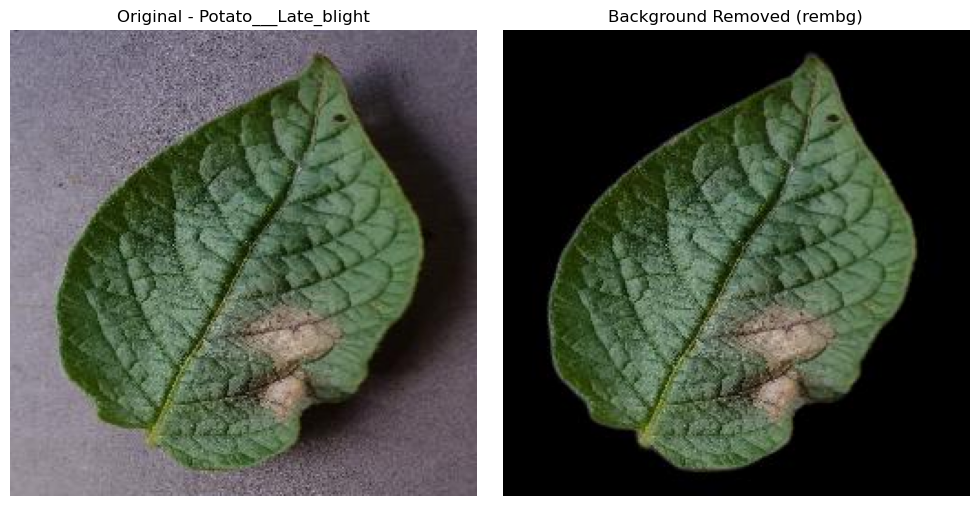

In [61]:
# Set original and cleaned directories
original_root = 'potato-disease/training/PlantVillage/color'
cleaned_root = 'cleaned_data_rembg'  

# Randomly choose a class folder
class_folders = os.listdir(original_root)
chosen_class = random.choice(class_folders)

# Get image files from that class
image_files = os.listdir(os.path.join(original_root, chosen_class))
chosen_image = random.choice(image_files)

# Construct full paths
original_path = os.path.join(original_root, chosen_class, chosen_image)
cleaned_path = os.path.join(cleaned_root, chosen_class, chosen_image)

# Load and convert both images
original_img = cv2.imread(original_path)
original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)

cleaned_img = cv2.imread(cleaned_path)
cleaned_img = cv2.cvtColor(cleaned_img, cv2.COLOR_BGR2RGB)

# Plot both
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(original_img)
plt.title(f"Original - {chosen_class}")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(cleaned_img)
plt.title("Background Removed (rembg)")
plt.axis("off")

plt.tight_layout()
plt.show()




To improve model focus and reduce background noise, a semantic segmentation technique was employed using the `rembg` library. This AI-powered method utilizes a pretrained U-2-Net deep learning model to automatically remove the background and isolate the leaf object from the image. Each image was processed by loading it through the Python Imaging Library (PIL), applying the `remove()` function, and saving the resulting leaf-only image into a clean dataset directory. This technique ensures that the model receives only the relevant leaf region as input, enhancing both classification accuracy and interpretability.


## Train the VGG16 Model again using the removed background images

In [62]:
import tensorflow as tf
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
import matplotlib.pyplot as plt

# Constants
IMAGE_SIZE = 256
BATCH_SIZE = 32
INPUT_SHAPE = (IMAGE_SIZE, IMAGE_SIZE, 3)

dataset = tf.keras.preprocessing.image_dataset_from_directory(
    "cleaned_data_rembg",
    seed=123,
    shuffle=True,
    image_size=(IMAGE_SIZE, IMAGE_SIZE),
    batch_size=BATCH_SIZE
)

class_names = dataset.class_names
print("Classes:", class_names)

ds_size = len(dataset)
train_size = int(0.8 * ds_size)
val_size = int(0.1 * ds_size)

train_ds = dataset.take(train_size)
val_ds = dataset.skip(train_size).take(val_size)
test_ds = dataset.skip(train_size + val_size)

AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.cache().shuffle(1000).prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)
test_ds = test_ds.cache().prefetch(buffer_size=AUTOTUNE)


Found 2152 files belonging to 3 classes.
Classes: ['Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy']


In [63]:
base_model = VGG16(weights='imagenet', include_top=False, input_shape=INPUT_SHAPE)

# Freeze base model
for layer in base_model.layers:
    layer.trainable = False

# Add custom head
x = base_model.output
x = Flatten()(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.5)(x)
output = Dense(len(class_names), activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=output)
model.summary()


Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_4 (InputLayer)           │ (None, 256, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 256, 256, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 256, 256, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 128, 128, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 128, 128, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 128, 128, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 64, 64, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 64, 64, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 64, 64, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 64, 64, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 32, 32, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 32, 32, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 32, 32, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 32, 32, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 16, 16, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 16, 16, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 16, 16, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 16, 16, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 8, 8, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_2 (Flatten)                  │ (None, 32768)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 512)                 │      16,777,728 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 31,493,955 (120.14 MB)

 Trainable params: 16,779,267 (64.01 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [64]:
model.compile(
    optimizer=Adam(),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

early_stopping = EarlyStopping(
    monitor='val_accuracy',
    patience=5,
    restore_best_weights=True,
    verbose=1
)

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=10,
    callbacks=[early_stopping]
)


Epoch 1/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 285s 5s/step - accuracy: 0.7444 - loss: 21.5093 - val_accuracy: 0.9635 - val_loss: 0.4969
Epoch 2/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 302s 6s/step - accuracy: 0.9256 - loss: 1.0087 - val_accuracy: 0.9427 - val_loss: 0.2893
Epoch 3/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 325s 6s/step - accuracy: 0.9616 - loss: 0.2539 - val_accuracy: 0.9479 - val_loss: 0.4776
Epoch 4/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 367s 7s/step - accuracy: 0.9634 - loss: 0.2893 - val_accuracy: 0.9688 - val_loss: 0.1824
Epoch 5/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 348s 6s/step - accuracy: 0.9674 - loss: 0.1403 - val_accuracy: 0.9635 - val_loss: 0.2514
Epoch 6/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 398s 7s/step - accuracy: 0.9730 - loss: 0.1147 - val_accuracy: 0.9740 - val_loss: 0.1948
Epoch 7/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 375s 7s/step - accuracy: 0.9711 - loss: 0.2007 - val_accuracy: 0.9635 - val_loss: 0.2451
Epoch 8/10
54/54 ━━━━━━━━━━━━━━━━━━━━ 320s 6s/step - accuracy: 0.9679 - loss: 0.1740 - val_accuracy: 0.9792 - 

# This time, we are getting accuracy around 99% from our training dataset. But before removing the background, our training accuracy was 92%. That's a big improvement. 

In [65]:
test_loss, test_accuracy = model.evaluate(test_ds)
print(f" Final Test Accuracy: {test_accuracy:.4f}")

8/8 ━━━━━━━━━━━━━━━━━━━━ 40s 5s/step - accuracy: 0.9430 - loss: 0.6961
 Final Test Accuracy: 0.9483


## In terms of test accuracy, we are getting 95% now, but initially with the background images, it was 97%. We will check the confusion matrix of each case and then decide which model we are going to use. 

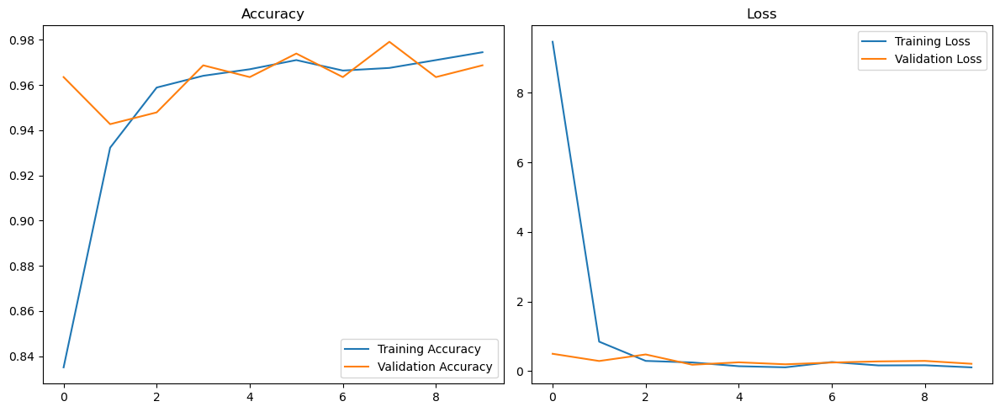

In [66]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs_range = range(len(acc))

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy')
plt.plot(epochs_range, val_acc, label='Validation Accuracy')
plt.title('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss')
plt.plot(epochs_range, val_loss, label='Validation Loss')
plt.title('Loss')
plt.legend()

plt.tight_layout()
plt.show()


## Apply grad CAM now with the removed background images and check from where our model is learning now. 

In [67]:
import numpy as np
import cv2
import tensorflow as tf

def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    grad_model = tf.keras.models.Model(
        [model.inputs],
        [model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(tf.expand_dims(img_array, axis=0))
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])
        class_output = predictions[:, pred_index]

    grads = tape.gradient(class_output, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap + tf.keras.backend.epsilon())
    return heatmap.numpy()

def display_gradcam(image, heatmap, alpha=0.4):
    heatmap = cv2.resize(heatmap, (image.shape[1], image.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    heatmap_color = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    if image.dtype != np.uint8:
        image = np.uint8(255 * image)

    overlay = cv2.addWeighted(image, 1 - alpha, heatmap_color, alpha, 0)
    return overlay


C:\Users\sabbir__dewan\anaconda3\Lib\site-packages\keras\src\models\functional.py:238: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor_90']]
Received: inputs=Tensor(shape=(1, 256, 256, 3))
  warnings.warn(msg)


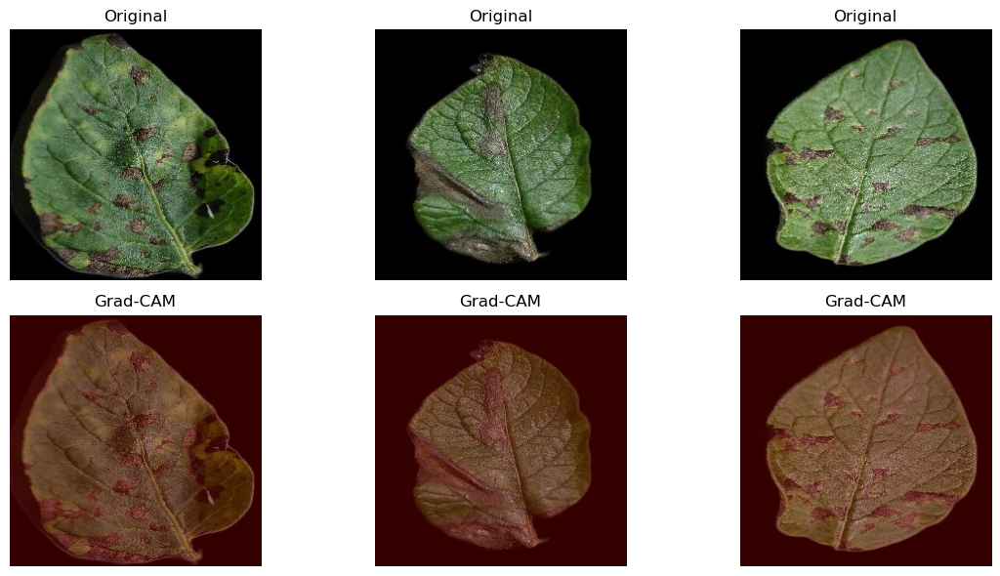

In [68]:
import matplotlib.pyplot as plt
import random
import numpy as np
from tensorflow.keras.applications.vgg16 import preprocess_input

# Step 1: Collect all test images into a list
all_images = []
all_labels = []

for batch_images, batch_labels in test_ds:
    for img, label in zip(batch_images, batch_labels):
        all_images.append(img.numpy().astype("uint8"))
        all_labels.append(label.numpy())

# Step 2: Randomly select 3 indices
selected_indices = random.sample(range(len(all_images)), 3)

# Step 3: Plot the selected images and Grad-CAMs
plt.figure(figsize=(12, 6))

for i, idx in enumerate(selected_indices):
    img = all_images[idx]
    preprocessed_img = preprocess_input(img.copy())

    # Grad-CAM
    heatmap = make_gradcam_heatmap(preprocessed_img, model, last_conv_layer_name='block5_conv3')
    cam_img = display_gradcam(img, heatmap)

    # Plot Original
    plt.subplot(2, 3, i + 1)
    plt.imshow(img)
    plt.title("Original")
    plt.axis("off")

    # Plot Grad-CAM
    plt.subplot(2, 3, i + 4)
    plt.imshow(cam_img)
    plt.title("Grad-CAM")
    plt.axis("off")

plt.tight_layout()
plt.show()


 ## In diseased leaves, now the Grad-CAM successfully emphasized areas containing visible lesions and infection spots, confirming that the model learned to attend to biologically meaningful regions. In contrast, healthy or less infected regions showed minimal activation.

# Add a confusion matrix after background remove 

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


<Figure size 600x500 with 0 Axes>

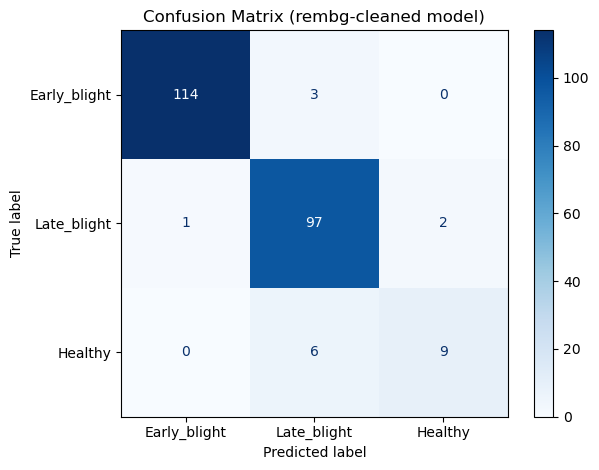

In [69]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Get class names
class_names = test_ds.class_names if hasattr(test_ds, 'class_names') else ['Early_blight', 'Late_blight', 'Healthy']

# Gather all true labels and predictions
y_true = []
y_pred = []

for images, labels in test_ds:
    preds = model.predict(images)
    y_true.extend(labels.numpy())
    y_pred.extend(np.argmax(preds, axis=1))

# Create confusion matrix
cm = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)

# Plot
plt.figure(figsize=(6, 5))
disp.plot(cmap='Blues', values_format='d')
plt.title("Confusion Matrix (rembg-cleaned model)")
plt.tight_layout()
plt.show()



In [70]:
from sklearn.metrics import classification_report

# Define class names
class_names = test_ds.class_names if hasattr(test_ds, 'class_names') else ['Early_blight', 'Late_blight', 'Healthy']

# Print classification report
print("Classification Report (rembg-cleaned model):\n")
print(classification_report(y_true, y_pred, target_names=class_names))


Classification Report (rembg-cleaned model):

              precision    recall  f1-score   support

Early_blight       0.99      0.97      0.98       117
 Late_blight       0.92      0.97      0.94       100
     Healthy       0.82      0.60      0.69        15

    accuracy                           0.95       232
   macro avg       0.91      0.85      0.87       232
weighted avg       0.95      0.95      0.95       232



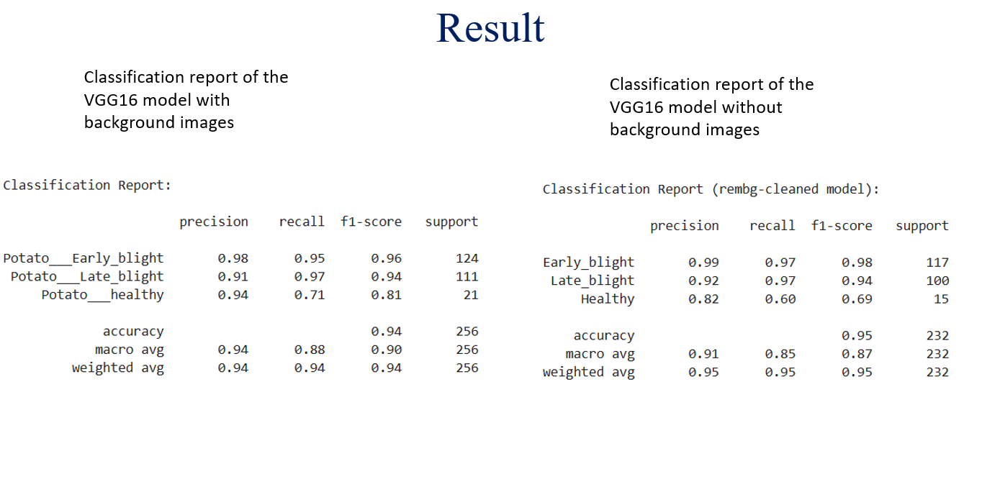

# Severity estimation before background image removal

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 198ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 182ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 181ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


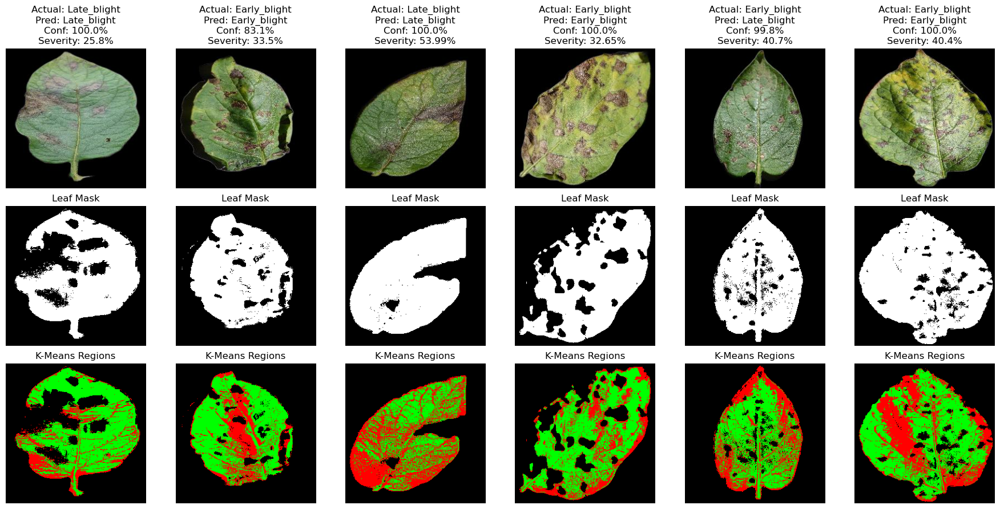

In [76]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans

# --- Utility Functions ---

def isolate_leaf(image):
    hsv = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    lower_green = np.array([25, 40, 40])
    upper_green = np.array([95, 255, 255])
    mask = cv2.inRange(hsv, lower_green, upper_green)
    result = cv2.bitwise_and(image, image, mask=mask)
    return result, mask

def estimate_disease_severity_with_visual(image):
    _, mask = isolate_leaf(image)
    pixels = image[mask > 0].reshape(-1, 3)
    if len(pixels) < 10:
        blank = np.zeros_like(image)
        return 0.0, mask, blank

    kmeans = KMeans(n_clusters=2, random_state=42)
    labels = kmeans.fit_predict(pixels)
    centers = kmeans.cluster_centers_
    diseased_ref = np.array([150, 75, 0])
    dist = np.linalg.norm(centers - diseased_ref, axis=1)
    disease_cluster = np.argmin(dist)

    severity = round((np.sum(labels == disease_cluster) / len(labels)) * 100, 2)

    cluster_img = np.zeros_like(image)
    cluster_pixels = np.zeros_like(pixels)
    cluster_pixels[labels == disease_cluster] = [255, 0, 0]
    cluster_pixels[labels != disease_cluster] = [0, 255, 0]
    cluster_img[mask > 0] = cluster_pixels

    return severity, mask, cluster_img

def predict(model, image):
    result = model.predict(tf.expand_dims(image, axis=0))
    predicted_class = np.argmax(result, axis=1)[0]
    confidence = 100 * np.max(result, axis=1)[0]
    return class_names[predicted_class], confidence

# --- Visualization Block ---

plt.figure(figsize=(18, 9))
for images, labels in test_ds.take(1):
    for i in range(6):
        img_np = images[i].numpy().astype("uint8")
        actual_class = class_names[labels[i].numpy()]
        predicted_class, confidence = predict(model, img_np)

        if predicted_class != "Potato___healthy":
            severity, mask, clustered = estimate_disease_severity_with_visual(img_np)
        else:
            severity = 0.0
            mask = np.zeros_like(img_np[:, :, 0])
            clustered = np.zeros_like(img_np)

        # Original image
        plt.subplot(3, 6, i + 1)
        plt.imshow(img_np)
        plt.title(f"Actual: {actual_class}\nPred: {predicted_class}\nConf: {confidence:.1f}%\nSeverity: {severity}%")
        plt.axis("off")

        # Leaf mask
        plt.subplot(3, 6, i + 7)
        plt.imshow(mask, cmap='gray')
        plt.title("Leaf Mask")
        plt.axis("off")

        # K-means segmentation
        plt.subplot(3, 6, i + 13)
        plt.imshow(clustered)
        plt.title("K-Means Regions")
        plt.axis("off")

plt.tight_layout()
plt.show()


In this implementation, I first use color-based filtering in the HSV color space to segment the leaf area from the background. This step ensures that only the leaf pixels are analyzed, and any irrelevant background noise is excluded.

Once the leaf is isolated, I apply K-Means clustering to the pixel values within the leaf region. The clustering algorithm divides the leaf pixels into two groups based on their color intensity. One cluster is assumed to represent healthy tissue (typically green), and the other is assumed to represent diseased areas (usually darker or brownish regions).

To determine which cluster is diseased, I compare each cluster center (average color) with a predefined reference diseased color (a brown RGB value). The cluster whose color is closest to the reference diseased color is identified as the diseased region.

The severity percentage is then calculated by dividing the number of pixels in the diseased cluster by the total number of pixels in the leaf mask:

# Severity (%) = (Number of diseased pixels / Total number of leaf pixels ) × 100


# Severity on the background removed images model

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 188ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 194ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 195ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 175ms/step


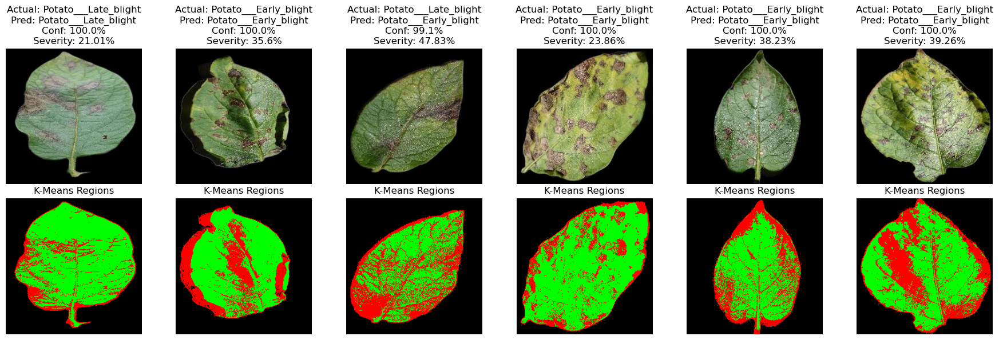

In [77]:
import cv2
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import tensorflow as tf

# Define class names (must match your model output classes)
class_names = ['Potato___Early_blight', 'Potato___Late_blight', 'Potato___healthy']

# Prediction function using your trained model
def predict(model, image):
    resized = cv2.resize(image, (256, 256))
    preprocessed = tf.keras.applications.vgg16.preprocess_input(resized)
    result = model.predict(tf.expand_dims(preprocessed, axis=0))
    predicted_class = np.argmax(result, axis=1)[0]
    confidence = 100 * np.max(result, axis=1)[0]
    return class_names[predicted_class], confidence

# Disease severity estimation for rembg-cleaned images
def estimate_disease_severity_rembg(image):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    mask = cv2.threshold(gray, 10, 255, cv2.THRESH_BINARY)[1]  # Detect non-black pixels

    pixels = image[mask > 0].reshape(-1, 3)
    if len(pixels) < 10:
        return 0.0, mask, np.zeros_like(image)

    kmeans = KMeans(n_clusters=2, random_state=42)
    labels = kmeans.fit_predict(pixels)
    centers = kmeans.cluster_centers_

    diseased_ref = np.array([150, 75, 0])  # brownish RGB
    dist = np.linalg.norm(centers - diseased_ref, axis=1)
    disease_cluster = np.argmin(dist)

    severity = round((np.sum(labels == disease_cluster) / len(labels)) * 100, 2)

    cluster_img = np.zeros_like(image)
    cluster_pixels = np.zeros_like(pixels)
    cluster_pixels[labels == disease_cluster] = [255, 0, 0]  # Red = diseased
    cluster_pixels[labels != disease_cluster] = [0, 255, 0]  # Green = healthy
    cluster_img[mask > 0] = cluster_pixels

    return severity, mask, cluster_img

# Plot 2 rows: Original + KMeans regions
plt.figure(figsize=(18, 6))
for images, labels in test_ds.take(1):
    for i in range(6):
        img_np = images[i].numpy().astype("uint8")
        actual_class = class_names[labels[i].numpy()]
        predicted_class, confidence = predict(model, img_np)

        if predicted_class != "Potato___healthy":
            severity, _, clustered = estimate_disease_severity_rembg(img_np)
        else:
            severity = 0.0
            clustered = np.zeros_like(img_np)

        # Original image
        plt.subplot(2, 6, i + 1)
        plt.imshow(img_np)
        plt.title(f"Actual: {actual_class}\nPred: {predicted_class}\nConf: {confidence:.1f}%\nSeverity: {severity}%")
        plt.axis("off")

        # K-means clustering visualization
        plt.subplot(2, 6, i + 7)
        plt.imshow(clustered)
        plt.title("K-Means Regions")
        plt.axis("off")

plt.tight_layout()
plt.show()
